### Figure 2 of *Grund & Ritter (2020)*, GJI


This Jupyter Notebook allows to reproduce **Fig. 2** of our GJI paper:

> _**Grund, M. & Ritter, J. R. R. (2020)**_, Shear-wave splitting beneath Fennoscandia — evidence for dipping structures and laterally varying multilayer anisotropy, *Geophysical Journal International*, https://doi.org/10.1093/gji/ggaa388.

Feel free to modify or play around with the different parameters!

**PyGMT and GMT requirements history:**
* 2020-07-23 (original version): PyGMT [0.1.0](https://www.pygmt.org/v0.1.0/index.html) & GMT >= [6.0.0](https://docs.generic-mapping-tools.org/6.0/)
* 2021-08-08: PyGMT [0.4.0](https://www.pygmt.org/v0.4.0/index.html) & GMT >= [6.2.0](https://docs.generic-mapping-tools.org/6.2/)
* 2023-03-27: PyGMT [0.8.0](https://www.pygmt.org/v0.8.0/index.html) & GMT >= [6.3.0](https://docs.generic-mapping-tools.org/6.3/)
* 2025-08-26: PyGMT [0.16.0](https://www.pygmt.org/v0.16.0/index.html) & GMT >= [6.4.0](https://docs.generic-mapping-tools.org/6.4/)
* 2026-08-27 (last modified): PyGMT [0.19.0](https://www.pygmt.org/v0.19.0/index.html) & GMT >= [6.5.0](https://docs.generic-mapping-tools.org/6.5/)


**Additional required packages:**
* pandas
* numpy
* [ObsPy](https://github.com/obspy/obspy/wiki)

**Author**: 
* Michael Grund ([@michaelgrund](https://github.com/michaelgrund))





In [1]:
import pygmt
import pandas as pd
import numpy as np
from obspy.geodetics.base import gps2dist_azimuth

In [2]:
# create figure object
fig = pygmt.Figure() 

In [3]:
# define parameters for plotting
pygmt.config(FONT_ANNOT_PRIMARY = '8p,Helvetica',
            FONT_LABEL = '8',
            MAP_LABEL_OFFSET = '5.5p',
            MAP_TICK_LENGTH_PRIMARY = '4p',
            PS_MEDIA ='A2',
            PROJ_LENGTH_UNIT = 'c',
            MAP_ANNOT_OFFSET_PRIMARY = '5p',
            MAP_ANNOT_OFFSET_SECONDARY = '5p',
            MAP_FRAME_TYPE = 'plain',
            MAP_FRAME_WIDTH = '2p',
            FORMAT_GEO_MAP = 'D',
            PS_CHAR_ENCODING = 'Standard+',
            MAP_FRAME_PEN = '1.2p,black')  

#### Part (a)

grdblend [NOTICE]: Remote data courtesy of GMT data server oceania [http://oceania.generic-mapping-tools.org]
grdblend [NOTICE]: SRTM15 Earth Relief v2.7 at 01x01 arc minutes reduced by Gaussian Cartesian filtering (5.2 km fullwidth) [Tozer et al., 2019].
grdblend [NOTICE]:   -> Download 30x30 degree grid tile (earth_relief_01m_p): N30E000


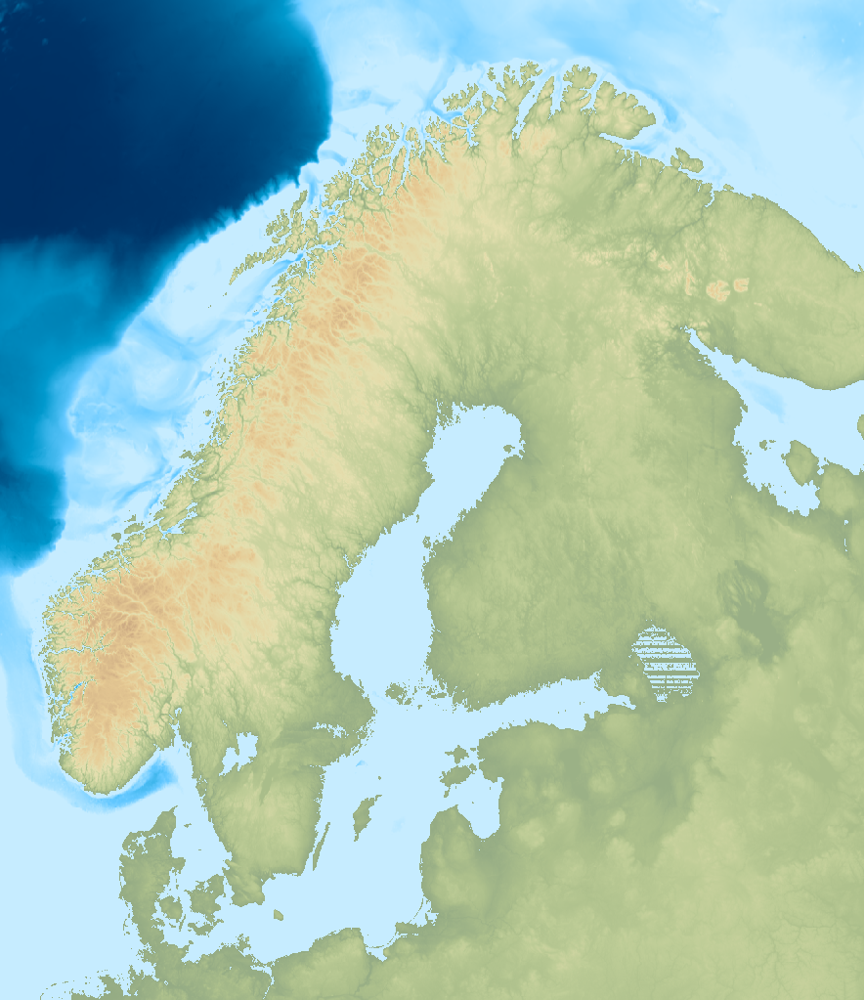

In [4]:
# define region
regvals = [3, 40, 53, 72]
cmapo = 'topo.cpt'

fig.grdimage('@earth_relief_01m', 
             region = regvals, 
             projection = 'm1:55000000', 
             cmap = cmapo)
fig.show()

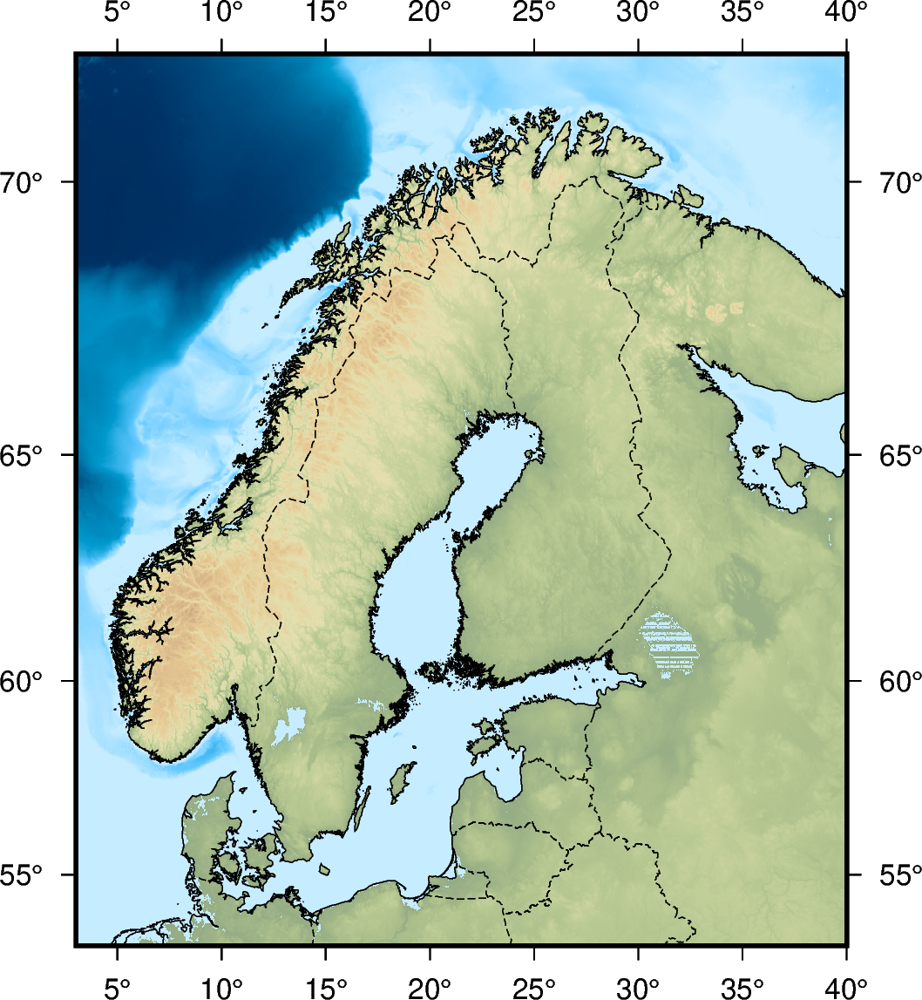

In [5]:
# plot shorelines, borders with an immediate resolution and add a frame.
fig.coast(resolution = 'i', 
          shorelines ='1/thinnest,black', 
          frame = ['x5', 'y5', 'NSEW'],
          borders = '1/0.25p,-')

fig.show()

In [6]:
# read file with station data using pandas
filein = 'sta_coordinates.txt'
namescol = ['staname','lon', 'lat']
datatab = pd.read_table(filein, sep=r"\s+", names = namescol)

#first take a look on the data (top and bottom)
datatab

,staname,lon,lat
0,AAL,19.99360,60.17800
1,AKN,6.99740,62.17830
2,ARA0,25.50580,69.53490
3,ARBE,25.98410,59.43650
4,ARE0,25.50575,69.53487
...,...,...,...
261,NBB17,13.95810,66.81610
262,NBB28,14.46220,67.19090
263,NBB29,15.32920,66.99190
264,NBB30,13.73540,66.97320


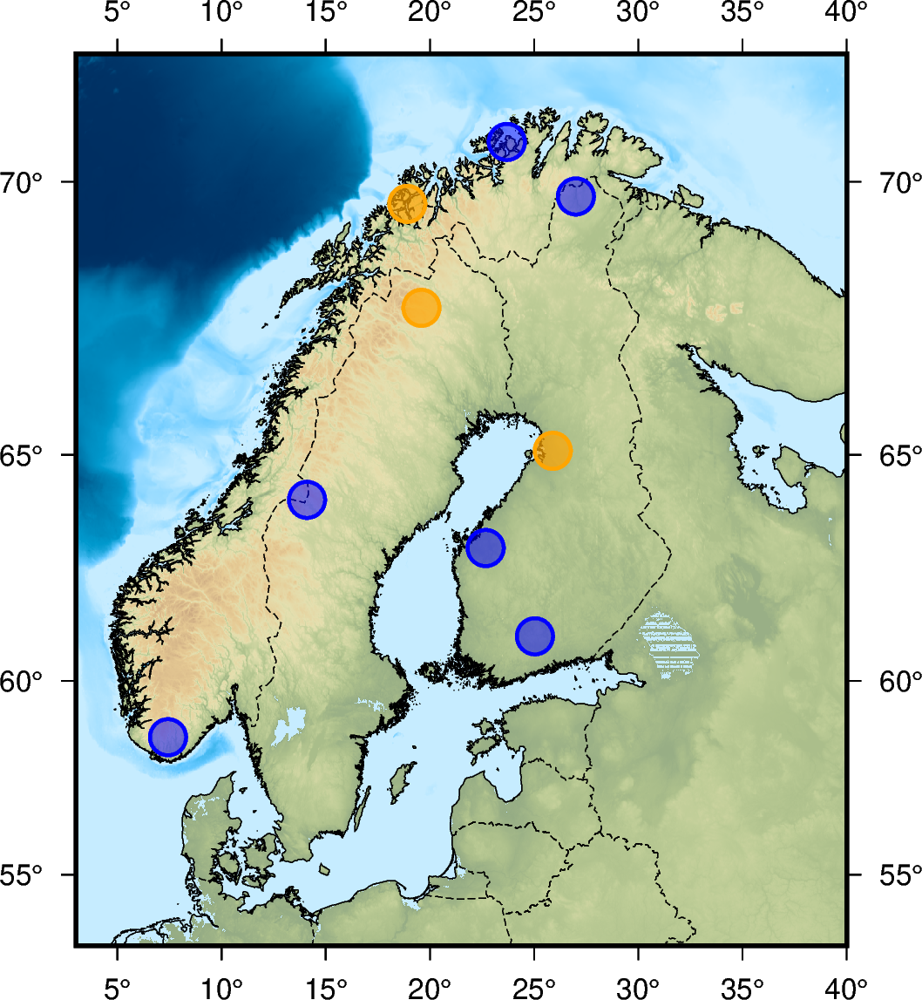

In [7]:
# mark stations that should be highlighted in the map

# helper function
def plot_stas_hl(stalist, circsize, circthick, circcol, circtrans):
    fig.plot(x = datatab.lon[datatab['staname'].isin(stalist)] ,
             y = datatab.lat[datatab['staname'].isin(stalist)], 
             style = circsize, 
             pen = circthick + ',' + circcol,  
             fill = circcol + '@' + circtrans) # plot circle fill transparent

# stations for which stereoplots are shown in Fig. 6 of the paper
circthick = '0.034c'
circtrans = '50' 
circsize = 'c0.35c'
circcol = 'blue'
stalist = ['KEV', 'HAMF', 'VAF', 'NWG28', 'SA64', 'SA39']

plot_stas_hl(stalist, circsize, circthick, circcol, circtrans) 

# stations for which modeling are shown in Fig. 8 of the paper
circtrans = '30'
circcol = 'orange'
stalist = ['OUL', 'TRO', 'RATU']

plot_stas_hl(stalist, circsize, circthick, circcol, circtrans) 

fig.show()

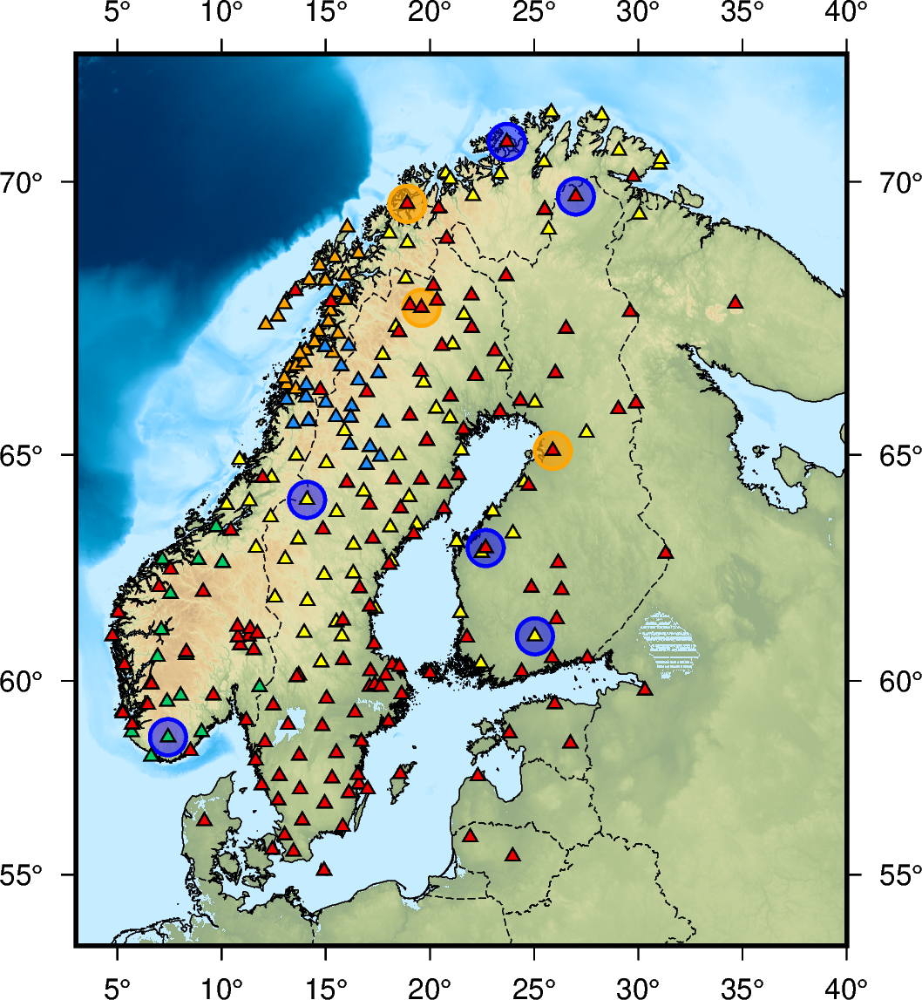

In [8]:
# now plot the locations of the full set of stations on top

# station symbol and size
stasym = 't0.16c'
# thickness of edges and color
staedg = '0.015c' + ',black'

# helper function
def plot_stas(staid, stacol, stalab):
    fig.plot(x = datatab.lon[datatab['staname'].str.startswith(staid)],
             y = datatab.lat[datatab['staname'].str.startswith(staid)], 
             style = stasym, 
             pen = staedg, 
             fill = stacol, 
             label = stalab)  

# plot temporary networks based on their initial letters    
plot_stas('SA', 'yellow', 'ScanArray Core')    
plot_stas(('N2','NBB'), 'orange', 'Neonor2') 
plot_stas('N1', 'dodgerblue', 'SCANLIPS3D') 
plot_stas('NWG', '0/205/102', 'MAGNUS') 

# plot the remaining ones which are the permanent stations
fig.plot(x = datatab.lon[0:136], 
         y = datatab.lat[0:136], 
         style = stasym, 
         pen = staedg, 
         fill = 'red2', 
         label = 'permanent')

fig.show()

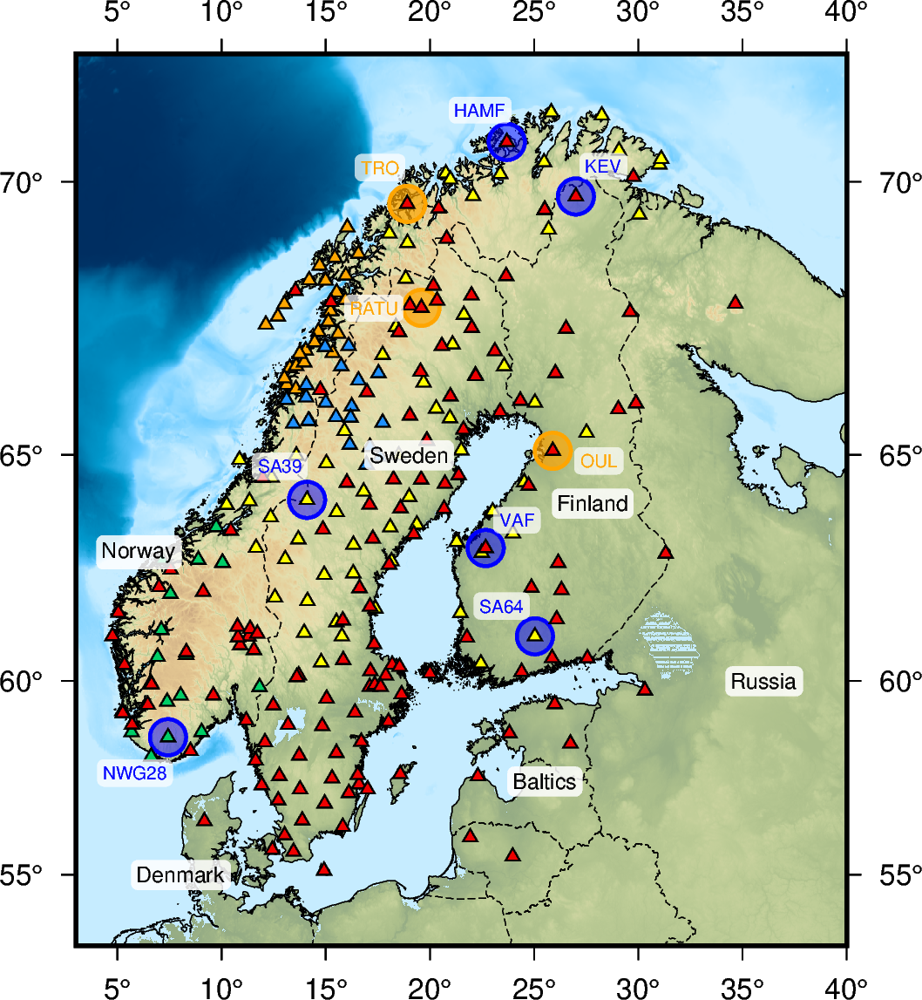

In [9]:
# now we add annotations to the highlighted stations

# first we define some text adjustments for each annotation as well as the color in a dictionary
nlist = {'KEV': 
          {'xshift': 1.3,
           'yshift': 0.5,
           'col': 'blue'},
          'HAMF': 
          {'xshift': -1.3,
           'yshift': 0.5,
           'col': 'blue'},
          'VAF': 
          {'xshift': 1.5 ,
           'yshift': 0.6,
           'col': 'blue'},
          'NWG28': 
          {'xshift': -1.6,
           'yshift': -0.9,
           'col': 'blue'},
          'SA64': 
          {'xshift': -1.6,
           'yshift': 0.7,
           'col': 'blue'},
          'SA39': 
          {'xshift': -1.3,
           'yshift': 0.7,
           'col': 'blue'},
          'OUL': 
          {'xshift': 2.2,
           'yshift': -0.2,
           'col': 'orange'},
          'TRO': 
          {'xshift': -1.3,
           'yshift': 0.6,
           'col': 'orange'},
          'RATU': 
          {'xshift': -2.3,
           'yshift': 0,
           'col': 'orange'}}

textsize = '5p'
textbcol = 'white'
textbcoltr = '30'

# define annotation function
def annot_stas_hl(staname, xshift, yshift, txtcol):
    fig.text(x = datatab.lon[datatab['staname'].isin([staname])] + xshift, 
             y = datatab.lat[datatab['staname'].isin([staname])] + yshift, 
             text = staname, 
             font = textsize + ',' + txtcol, 
             fill = textbcol + '@' + textbcoltr, # use transparency for text boxes
             clearance = '0.025i/0.025i+tO') # adjust clearance between text and surrounding box, use rounded corners
         
# loop over all keys which represent the station names at which the annotation should be plotted         
for staname in nlist.keys():
    xshift = nlist[staname]['xshift']
    yshift = nlist[staname]['yshift']
    txtcol = nlist[staname]['col']
    annot_stas_hl(staname, xshift, yshift, txtcol)
      
# annotate countries      
clist = {'Norway': 
          {'x': 6,
           'y': 63},
         'Sweden': 
           {'x': 19,
            'y': 65},
         'Finland': 
           {'x': 27.8,
            'y': 64},          
         'Russia': 
           {'x': 36,
            'y': 60},          
         'Baltics': 
           {'x': 25.5,
            'y': 57.5},          
         'Denmark': 
           {'x': 8,
            'y': 55}}
                 
for country in clist.keys(): 
    fig.text(x = clist[country]['x'], 
             y = clist[country]['y'], 
             text = country, 
             font = '6p,Helvetica,black', 
             fill = textbcol + '@15', # use transparency for text boxes
             clearance = '0.025i/0.025i+tO') # adjust clearance between text and surrounding box, use rounded corners    

fig.show()  

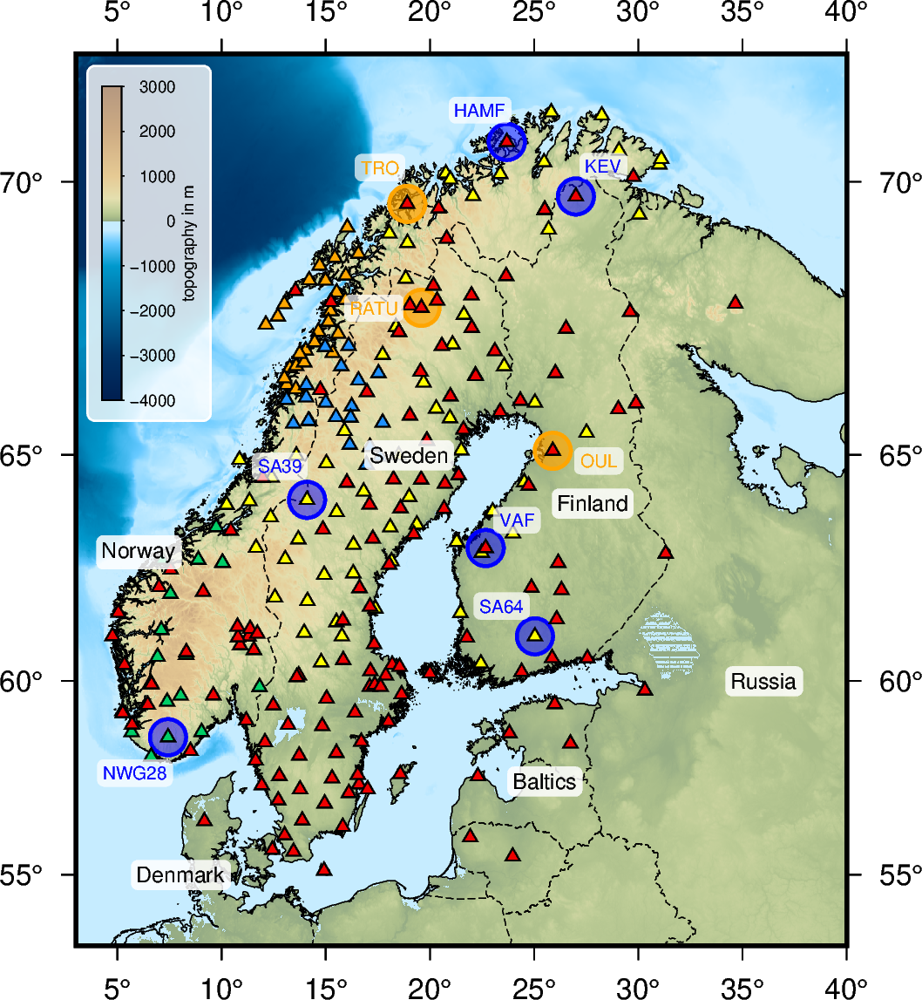

In [10]:
# add colorbar that shows topography
with pygmt.config(FONT_ANNOT_PRIMARY = '10p,Helvetica',
                  FONT_LABEL = '10p',
                  MAP_ANNOT_OFFSET_PRIMARY = '0.05i',
                  MAP_TICK_LENGTH_PRIMARY = '0.05',
                  MAP_LABEL_OFFSET = '3.5p',
                  MAP_FRAME_PEN = '0.8p'):

    fig.colorbar(cmap = 'topo.cpt',
                 position="x0.1i/2.085i+w1.2i/0.075i",
                 frame=['x1000+ltopography in m'],
                 box = '+r2p+p0.5p,white+gwhite@20')
    
fig.show()

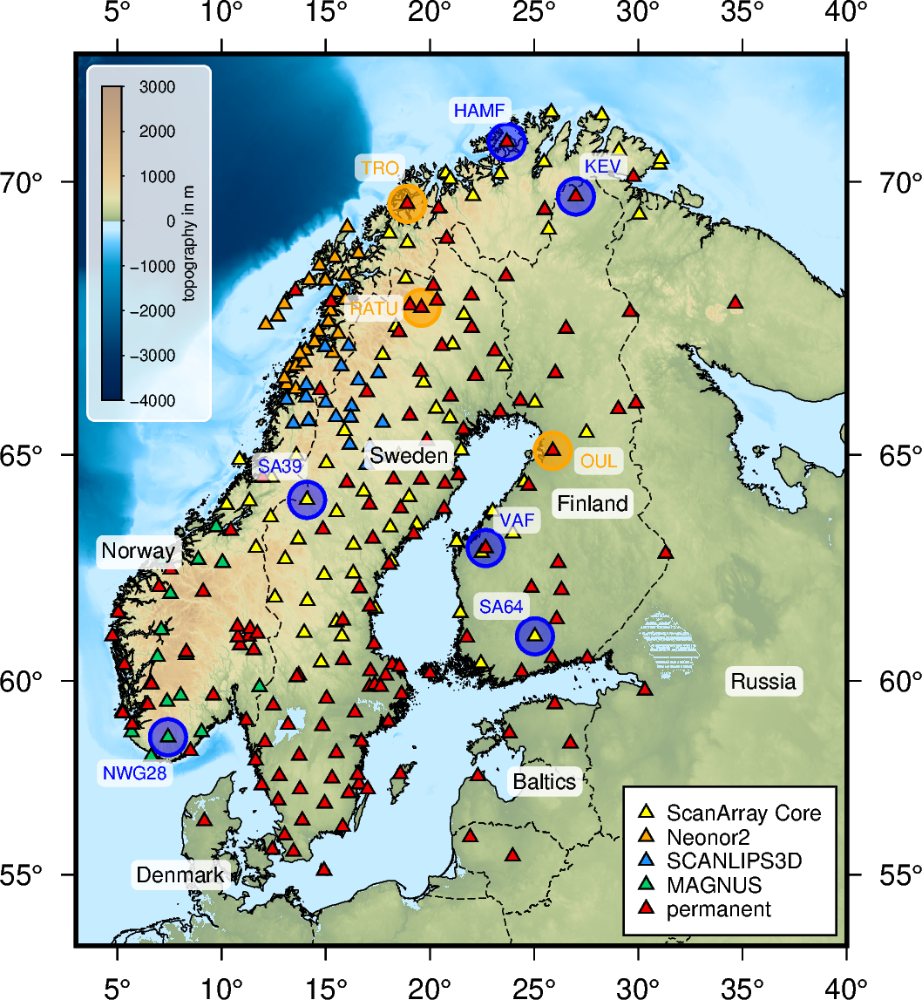

In [11]:
# we finish part (a) by adding a legend in the lower right corner which describes the displayed triangles  
with pygmt.config(FONT_ANNOT_PRIMARY = '6p,Helvetica',
                  FONT_LABEL = '6',
                  MAP_FRAME_PEN = '0.4p'):

    fig.legend(position = 'JBR+jBR+o0.1c', box = '+gwhite+p0.5p,black')

fig.show()

#### Part (b)

Now we continue with the second part of the figure - the event distribution. The following code is very similar to the notebook I published [here](https://github.com/michaelgrund/GMT-plotting/blob/master/001_map_equidist_EQ/pygmt_jupyter_notebook/pygmt_plot_equidist_EQs.ipynb).

coast [WARNING]: Fill/clip continent option (-G) may not work for this projection.
coast [WARNING]: If the antipode (0/5.49825e-310) is in the ocean then chances are good it will work.
coast [WARNING]: Otherwise, avoid projection center coordinates that are exact multiples of 200 degrees.


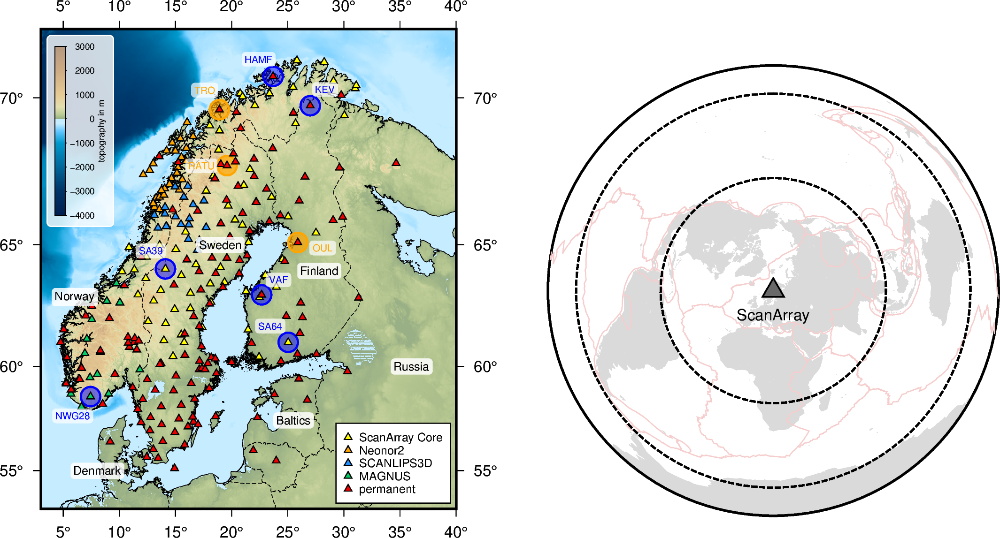

In [12]:
# first make a shift to the right
fig.shift_origin(xshift = '3.6i', yshift = '-0.05i')

# center of map
centerN = 65 # latitude in degrees
centerE = 20 # longitude in degrees

colfill = '217.6/217.6/217.6'
fig.coast(region='g', projection = 'E' + str(centerE) + '/'+ str(centerN) + '/160/3.2i', \
          resolution = 'c', land = colfill, shorelines ='1/0.1p,' + colfill, lakes = colfill, frame = True)

# plot plate boundaries after Bird (2003)
plbfile = 'pb2003_GMTready.txt'
plbcol = '245.76/204.8/204.8'
fig.plot(data = plbfile, pen = '0.5p,' + plbcol)

# plot circles at 80 and 140 degrees distance, use here twice the value since GMT expects the diameter
distlims = [80, 140]
fig.plot(x = centerE, 
         y = centerN, 
         style ='E-' + str(2 * distlims[0]) + 'd', 
         pen ='thick,black,3_1:0p')

fig.plot(x = centerE, 
         y = centerN, 
         style ='E-' + str(2 * distlims[1]) + 'd', 
         pen ='thick,black,3_1:0p')

# plot station marker
fig.plot(x = centerE, y = centerN, fill = '105/105/105', style = 't0.45c', pen ='0.7p,black')

# add annotation
fig.text(x = 20, 
         y = 48,
         text = 'ScanArray', 
         font = '8p,Helvetica,black')

fig.show(width = 800)

In [13]:
# read file with earthquake data using pandas
filein = 'eqs_used.dat'
namescol = ['lat', 'lon', 'depth', 'mag']
data = pd.read_table(filein, 
                     sep=r"\s+", 
                     names = namescol)

# calculate distance from each EQ to center of map, later this may be available in pygmt as psproject,
# instead use obspy now
data['isin'] = np.full(np.shape(data)[0], False) # generate new column in dataframe filled with False

for ii in range(0,len(data)):
    if distlims[0] < gps2dist_azimuth(centerN, centerE, data['lat'][ii], data['lon'][ii])[0]/111/1000 < distlims[1]:
        data.loc[ii, 'isin'] = True

# use only EQs within the given distance range     
datafilt = data[data['isin'] == True].copy()  

datafilt.head()

,lat,lon,depth,mag,isin
0,-17.55,-179.09,537.2,7.140787,True
1,0.21,119.58,33.0,6.610765,True
2,8.14,123.73,657.8,6.004727,True
3,-18.37,168.17,33.0,6.069105,True
4,-32.31,-71.29,51.1,6.417324,True


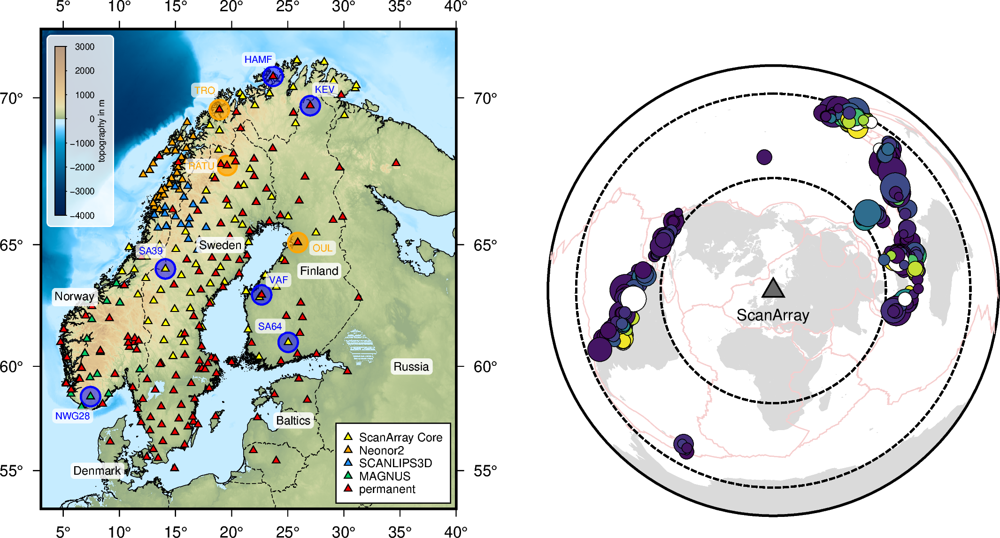

In [14]:
# Define colormap, set reverse = true if you want to reverse the colormap
pygmt.makecpt(cmap = 'viridis', 
              reverse = False, 
              series = [0, 600, 100], 
              continuous = True,  
              overrule_bg = True, 
              output = 'cmapEQs.cpt')

# plot the corresponding event locations
fig.plot(x = datafilt.lon, 
         y = datafilt.lat, 
         style = 'c' , 
         pen = 'black',
         size = np.exp(datafilt.mag/1.7)*0.0052, 
         fill = datafilt.depth, 
         cmap = 'cmapEQs.cpt')

fig.show(width = 800)

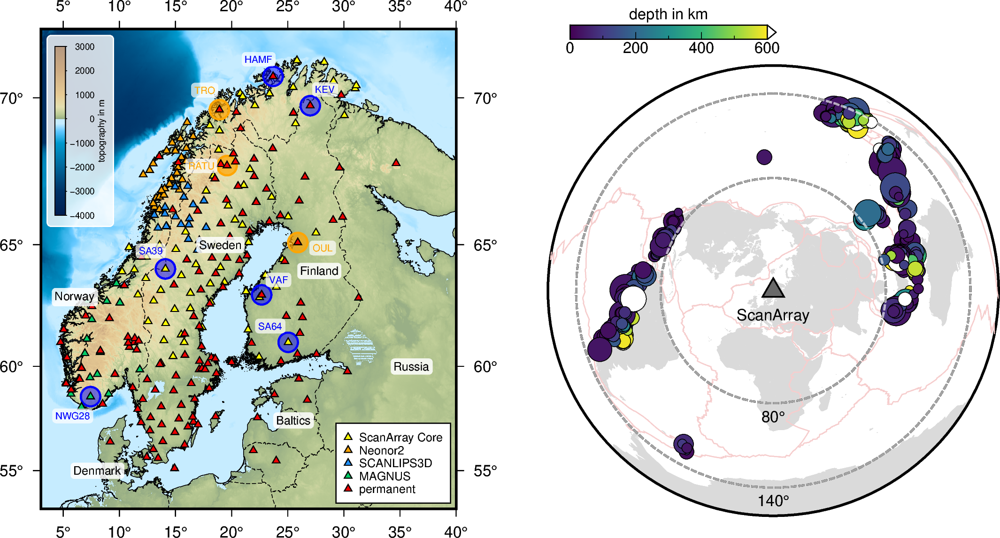

In [15]:
# plot distance circles again on top in transparent white
fig.plot(x = centerE, 
         y = centerN, 
         style = 'E-' + str(2 * distlims[0]) + 'd',
         pen = 'thick,white,3_1:0p', 
         transparency = '60')

fig.plot(x = centerE, 
         y = centerN, 
         style = 'E-' + str(2 * distlims[1]) + 'd', 
         pen = 'thick,white,3_1:0p', 
         transparency = '60')

# plot text on circles
fig.text(x = 20 , y = -24.5 , text = '80@.', font = '8p')
fig.text(x = 20 , y = -84 , text = '140@.', font = '8p')


# add colorbar 
with pygmt.config(FONT_ANNOT_PRIMARY = '16p,Helvetica',
                  FONT_LABEL = '16p',
                  MAP_ANNOT_OFFSET_PRIMARY = '0.04i',
                  MAP_LABEL_OFFSET = '0.09i', 
                  MAP_TICK_LENGTH_PRIMARY = '-0.1i',
                  MAP_FRAME_PEN = '1p'):
    
    fig.colorbar(cmap = 'cmapEQs.cpt', 
                 position = 'x0.4/8.6+w1.4i/0.1i+ef0.06i+ml+h', 
                 box = False, 
                 frame = ['+Ldepth in km', 'xaf'])

fig.show(width = 800)

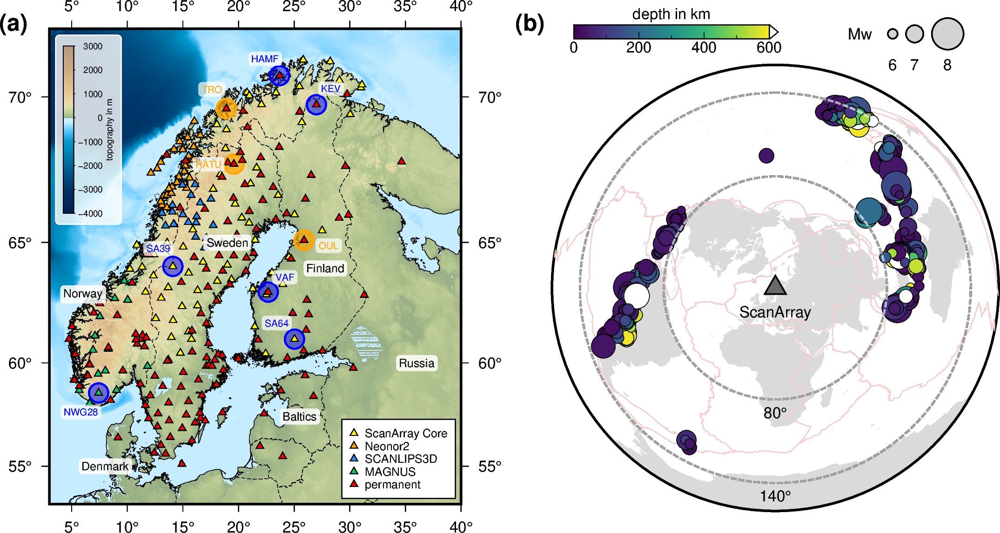

In [16]:
# plot custom magnitude legend

# helper function
def legend_mag(mag, xval, yvaltxt):
    
    if not isinstance(mag, str):
        fig.plot(region = [0, 20, 0, 20], 
                 projection = 'M4', 
                 x = xval, 
                 y = 40, 
                 style = 'c' + str(np.exp(mag/1.7)*0.0052), 
                 pen = '0.7p,black', 
                 fill = 'lightgray',
                 no_clip = True) # plot outside map frame, no clipping
        
        mag = str(mag)

    fig.text(x = xval, 
             y = yvaltxt , 
             text = mag, 
             font = '8p',
             no_clip = True)

# plot different magnitude circles and annotations 
legend_mag(6, 31, 37.8)   
legend_mag(7, 33, 37.8)    
legend_mag(8, 36, 37.8) 
legend_mag('Mw', 28, 40) 
  
    
# add annotations
fig.text(x = -49, 
         y = 40.8, 
         text = '(a)', 
         font = '12p,Helvetica-Bold',
         no_clip = True)

fig.text(x = -2, 
         y = 40.8, 
         text = '(b)', 
         font = '12p,Helvetica-Bold',
         no_clip = True) 
       
fig.show(width = 800)

In [17]:
# finally save figure in png format
fig.savefig('PLOT_fig2.png', dpi = 300)